 #  __HOUSE PRICE PREDICTION__

In [2]:
import pandas as pd
import numpy as np


import matplotlib.pyplot as plt
import seaborn as sns


import sklearn
import warnings
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.impute import KNNImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn import linear_model


from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, f1_score
from sklearn.metrics import mean_absolute_error

import dmba
from dmba import regressionSummary, exhaustive_search
from dmba import backward_elimination, forward_selection, stepwise_selection
from dmba import adjusted_r2_score, AIC_score, BIC_score

warnings.filterwarnings('ignore')


## READING THE DATA

In [4]:
house_df_raw = pd.read_csv("C:\\Users\\Sayal\\OneDrive\\Desktop\\7275\\Final Project Proposal\\Data\\archive (10)\\train.csv")

In [5]:
house_df_raw.head()

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,ADDRESS,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
0,Owner,0,0,2,BHK,1300.236407,1,1,"Ksfc Layout,Bangalore",12.969910,77.597960,55.0
1,Dealer,0,0,2,BHK,1275.000000,1,1,"Vishweshwara Nagar,Mysore",12.274538,76.644605,51.0
2,Owner,0,0,2,BHK,933.159722,1,1,"Jigani,Bangalore",12.778033,77.632191,43.0
3,Owner,0,1,2,BHK,929.921143,1,1,"Sector-1 Vaishali,Ghaziabad",28.642300,77.344500,62.5
4,Dealer,1,0,2,BHK,999.009247,0,1,"New Town,Kolkata",22.592200,88.484911,60.5


### DATA CLEANING

In [7]:
house_df_raw.isnull().sum()

POSTED_BY                0
UNDER_CONSTRUCTION       0
RERA                     0
BHK_NO.                  0
BHK_OR_RK                0
SQUARE_FT                0
READY_TO_MOVE            0
RESALE                   0
ADDRESS                  0
LONGITUDE                0
LATITUDE                 0
TARGET(PRICE_IN_LACS)    0
dtype: int64

In [8]:
house_df_raw.dtypes

POSTED_BY                 object
UNDER_CONSTRUCTION         int64
RERA                       int64
BHK_NO.                    int64
BHK_OR_RK                 object
SQUARE_FT                float64
READY_TO_MOVE              int64
RESALE                     int64
ADDRESS                   object
LONGITUDE                float64
LATITUDE                 float64
TARGET(PRICE_IN_LACS)    float64
dtype: object

In [9]:
house_df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29451 entries, 0 to 29450
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   POSTED_BY              29451 non-null  object 
 1   UNDER_CONSTRUCTION     29451 non-null  int64  
 2   RERA                   29451 non-null  int64  
 3   BHK_NO.                29451 non-null  int64  
 4   BHK_OR_RK              29451 non-null  object 
 5   SQUARE_FT              29451 non-null  float64
 6   READY_TO_MOVE          29451 non-null  int64  
 7   RESALE                 29451 non-null  int64  
 8   ADDRESS                29451 non-null  object 
 9   LONGITUDE              29451 non-null  float64
 10  LATITUDE               29451 non-null  float64
 11  TARGET(PRICE_IN_LACS)  29451 non-null  float64
dtypes: float64(4), int64(5), object(3)
memory usage: 2.7+ MB


In [10]:
house_df_raw.shape

(29451, 12)

In [11]:
house_df_raw['Price_per_sft']=house_df_raw['TARGET(PRICE_IN_LACS)']/house_df_raw['SQUARE_FT']
house_df_raw['Price_per_sft'] = house_df_raw['Price_per_sft'].round(decimals=2)

In [12]:
filtered_df = house_df_raw[(house_df_raw['SQUARE_FT'] < 50) & (house_df_raw['Price_per_sft'] > 3)]  #original
house_df_raw = house_df_raw.drop(filtered_df.index) # original 

In [13]:
filtered_df

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,ADDRESS,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS),Price_per_sft
2092,Owner,0,0,2,BHK,5.000000,1,1,"Sector-29 Chandigarh,Chandigarh",30.755000,76.777256,45.0,9.00
3269,Owner,0,0,2,BHK,3.000000,1,1,"industrial area,Hajipur",23.525713,87.287479,12.0,4.00
13763,Owner,0,0,2,BHK,3.985594,1,1,"Amlidih,Raipur",21.213822,81.676956,24.9,6.25
24528,Owner,0,0,2,BHK,9.397110,1,1,"Brajanathchak,Haldia",22.030000,88.060000,32.5,3.46


In [14]:
house_df_raw_viz=house_df_raw

In [15]:
pd.set_option('display.max_rows', 500)
house_df_raw[house_df_raw['TARGET(PRICE_IN_LACS)'] < 20.0]

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,ADDRESS,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS),Price_per_sft
29,Dealer,0,0,2,BHK,1000.000000,1,1,"Alwar Bypass Road,Bhiwadi",28.210200,76.860600,12.5,0.01
97,Owner,0,0,2,BHK,900.000000,1,1,"Kalol,Gandhinagar",23.225700,72.516790,18.0,0.02
105,Owner,0,0,1,BHK,483.091787,1,1,"Roha,Raigad",18.454300,73.114700,18.0,0.04
128,Owner,0,1,2,BHK,398.262129,1,1,"Purseni,Lucknow",26.707154,80.982346,11.0,0.03
134,Dealer,0,0,2,BHK,800.193986,1,1,"Jhotwara,Jaipur",26.955346,75.734793,16.5,0.02
...,...,...,...,...,...,...,...,...,...,...,...,...,...
29416,Owner,0,1,1,BHK,550.055005,1,1,"Jainpur,Meerut",28.939024,77.689176,10.0,0.02
29422,Owner,0,0,2,BHK,646.987465,1,1,"Buti Bori,Nagpur",21.000000,79.000000,16.0,0.02
29424,Owner,0,0,1,BHK,632.069195,1,1,"Chinchawali,Raigad",18.973700,73.332100,19.0,0.03
29427,Owner,0,0,2,BHK,1200.000000,1,1,"Kuber Nagar,Gandhinagar",23.074025,72.642538,15.0,0.01


In [16]:
house_df_raw[house_df_raw['TARGET(PRICE_IN_LACS)'] < 10.0]['TARGET(PRICE_IN_LACS)'].count()

139

In [17]:

house_df_raw[['Address1', 'Address2']] = house_df_raw['ADDRESS'].str.rsplit(',',n=1,expand=True)

indian_states = {
    "Andhra Pradesh", "Arunachal Pradesh", "Assam", "Bihar", "Chhattisgarh",
    "Goa", "Gujarat", "Haryana", "Himachal Pradesh", "Jharkhand",
    "Karnataka", "Kerala", "Madhya Pradesh", "Maharashtra", "Manipur",
    "Meghalaya", "Mizoram", "Nagaland", "Odisha", "Punjab", "Rajasthan",
    "Sikkim", "Tamil Nadu", "Telangana", "Tripura", "Uttar Pradesh",
    "Uttarakhand", "West Bengal", "Andaman and Nicobar Islands", "Chandigarh",
    "Dadra and Nagar Haveli and Daman and Diu", "Lakshadweep", "Delhi",
    "Puducherry", "Jammu and Kashmir", "Ladakh"
}


def update_address(row):
    last_value = row['Address2']
    if last_value in indian_states:
        parts = row['Address1'].rsplit(',', 1)
        if len(parts) > 1:
            row['Address2'] = parts[-1].strip()  
        elif len(parts) == 1:
            row['Address1'] = row['Address2']
    return row


house_df_raw = house_df_raw.apply(update_address, axis=1)



In [18]:
house_df_raw[['ADDRESS','Address1','Address2']].head()

,ADDRESS,Address1,Address2
0,"Ksfc Layout,Bangalore",Ksfc Layout,Bangalore
1,"Vishweshwara Nagar,Mysore",Vishweshwara Nagar,Mysore
2,"Jigani,Bangalore",Jigani,Bangalore
3,"Sector-1 Vaishali,Ghaziabad",Sector-1 Vaishali,Ghaziabad
4,"New Town,Kolkata",New Town,Kolkata


In [19]:
house_df_raw.drop(columns=['ADDRESS','Address1','LONGITUDE','LATITUDE'], inplace=True)

In [20]:
label_encoder = LabelEncoder()
house_df_raw_categorical = house_df_raw.select_dtypes(include=['object']).apply(label_encoder.fit_transform)

city_mapping = {col: dict(zip(label_encoder.classes_, range(len(label_encoder.classes_)))) 
                for col in house_df_raw_categorical.columns}

house_df_raw_numerical = house_df_raw.select_dtypes(exclude=['object'])
house_df_raw = pd.concat([house_df_raw_numerical, house_df_raw_categorical], axis=1)

print(city_mapping)


{'POSTED_BY': {'Agartala': 0, 'Agra': 1, 'Ahmednagar': 2, 'Ajmer': 3, 'Akola': 4, 'Aligarh': 5, 'Allahabad': 6, 'Alwar': 7, 'Ambala': 8, 'Amravati': 9, 'Amritsar': 10, 'Amroha': 11, 'Anand': 12, 'Anantapur': 13, 'Angul': 14, 'Arrah': 15, 'Asansol': 16, 'Aurangabad': 17, 'Baddi': 18, 'Bahadurgarh': 19, 'Balasore': 20, 'Bangalore': 21, 'Bankura': 22, 'Banswara': 23, 'Barabanki': 24, 'Bardhaman': 25, 'Bareilly': 26, 'Beed': 27, 'Belgaum': 28, 'Berhampur': 29, 'Betul': 30, 'Bhadrak': 31, 'Bhagalpur': 32, 'Bhandara': 33, 'Bharatpur': 34, 'Bharuch': 35, 'Bhavnagar': 36, 'Bhilai': 37, 'Bhimavaram': 38, 'Bhiwadi': 39, 'Bhiwani': 40, 'Bhopal': 41, 'Bhubaneswar': 42, 'Bhuj': 43, 'Bikaner': 44, 'Bilaspur': 45, 'Bokaro': 46, 'Chandigarh': 47, 'Chandrapur': 48, 'Chennai': 49, 'Chhindwara': 50, 'Chittoor': 51, 'Coimbatore': 52, 'Cuddalore': 53, 'Cuttack': 54, 'Dahod': 55, 'Dalhousie': 56, 'Darbhanga': 57, 'Darjeeling': 58, 'Dehradun': 59, 'Deoghar': 60, 'Dhanbad': 61, 'Dharuhera': 62, 'Dharwad': 63,

In [21]:
house_df_raw.head()

,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,READY_TO_MOVE,RESALE,TARGET(PRICE_IN_LACS),Price_per_sft,POSTED_BY,BHK_OR_RK,Address2
0,0,0,2,1300.236407,1,1,55.0,0.04,2,0,21
1,0,0,2,1275.000000,1,1,51.0,0.04,1,0,163
2,0,0,2,933.159722,1,1,43.0,0.05,2,0,21
3,0,1,2,929.921143,1,1,62.5,0.07,2,0,79
4,1,0,2,999.009247,0,1,60.5,0.06,1,0,136


In [22]:
house_df_raw['Address2'].nunique()

262

In [23]:
house_df_raw.rename(columns={'Price_per_sft': 'PRICE_PER_SFT', 'Address2': 'ADDRESS'}, inplace=True)

In [24]:
house_df_raw.head()

,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,READY_TO_MOVE,RESALE,TARGET(PRICE_IN_LACS),PRICE_PER_SFT,POSTED_BY,BHK_OR_RK,ADDRESS
0,0,0,2,1300.236407,1,1,55.0,0.04,2,0,21
1,0,0,2,1275.000000,1,1,51.0,0.04,1,0,163
2,0,0,2,933.159722,1,1,43.0,0.05,2,0,21
3,0,1,2,929.921143,1,1,62.5,0.07,2,0,79
4,1,0,2,999.009247,0,1,60.5,0.06,1,0,136


# DATA VISUALIZATION

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
#house_df_raw.dtypes

In [27]:
colors=['#6A7F52','#8B9E6B','#788D5A']

Text(0.5, 1.0, 'UNDER_CONSTRUCTION ')

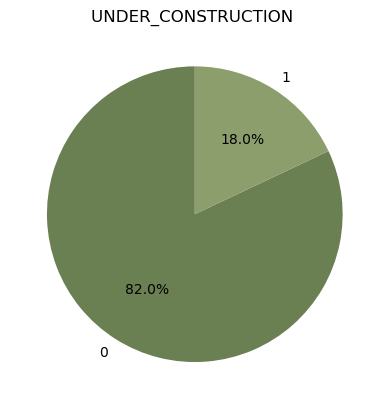

In [28]:

plt.pie(house_df_raw['UNDER_CONSTRUCTION'].value_counts(), 
        labels=house_df_raw['UNDER_CONSTRUCTION'].value_counts().index, 
        autopct='%1.1f%%', 
        startangle=90,
        colors=colors)

plt.title('UNDER_CONSTRUCTION ')


Text(0.5, 1.0, 'RERA')

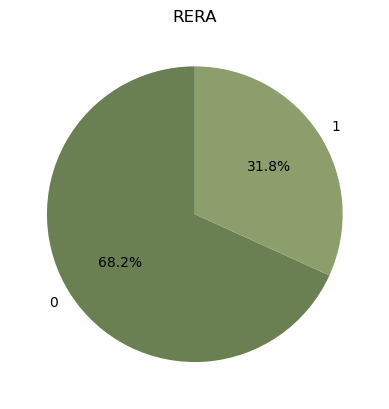

In [29]:

plt.pie(house_df_raw['RERA'].value_counts(), labels=house_df_raw['RERA'].value_counts().index, autopct='%1.1f%%', startangle=90,colors=colors)
plt.title('RERA')



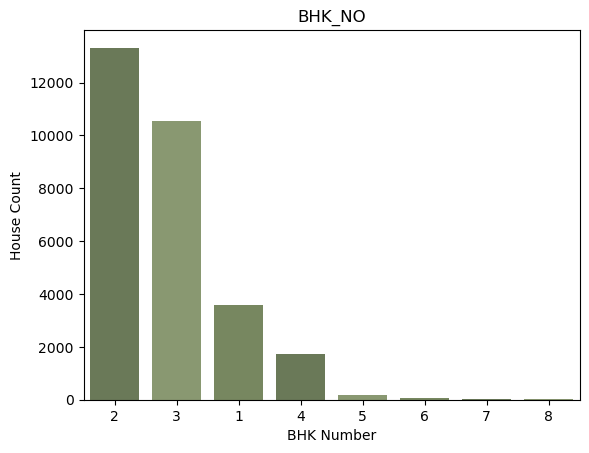

In [30]:
top_bhk = house_df_raw['BHK_NO.'].value_counts().nlargest(8).index
sns.countplot(x='BHK_NO.', data=house_df_raw, order=top_bhk, palette=colors)


plt.title('BHK_NO')
plt.xlabel('BHK Number')
plt.ylabel('House Count')


plt.show()


Text(0.5, 1.0, 'RESALE')

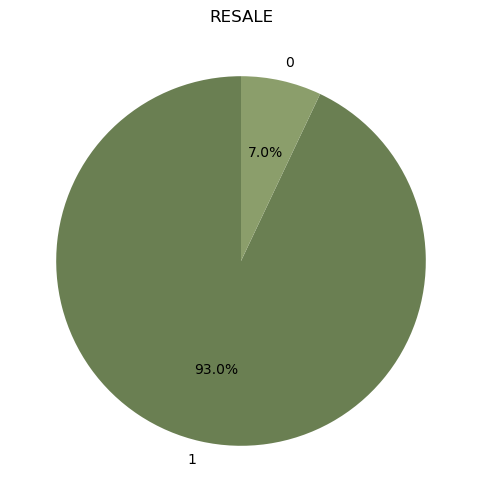

In [31]:
plt.figure(figsize=(6, 6))
plt.pie(house_df_raw['RESALE'].value_counts(), 
        labels=house_df_raw['RESALE'].value_counts().index, 
        autopct='%1.1f%%', 
        startangle=90,
        colors=colors) 


plt.title('RESALE')




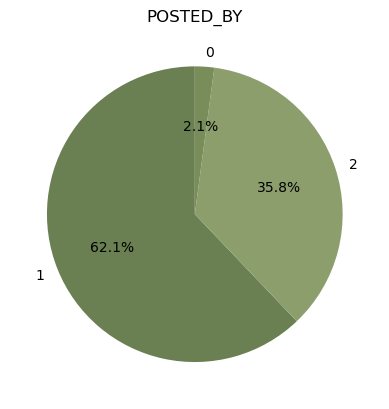

In [32]:


plt.pie(house_df_raw['POSTED_BY'].value_counts(), 
        labels=house_df_raw['POSTED_BY'].value_counts().index, 
        autopct='%1.1f%%', 
        startangle=90,
        colors=colors) 


plt.title('POSTED_BY')




plt.show()


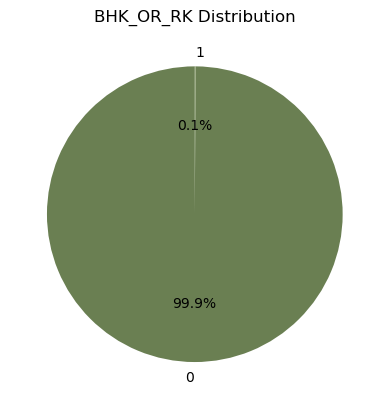

In [33]:


plt.pie(house_df_raw['BHK_OR_RK'].value_counts(), labels=house_df_raw['BHK_OR_RK'].value_counts().index, autopct='%1.1f%%', startangle=90,colors=colors)
plt.title('BHK_OR_RK Distribution')
plt.show()


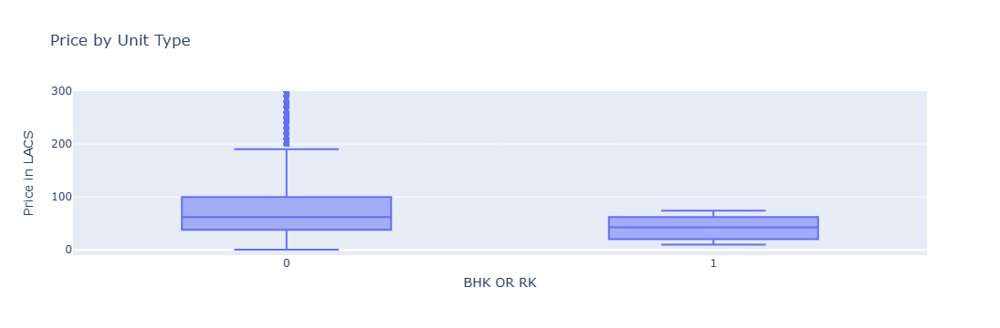

In [34]:
import plotly.express as px
fig=px.box(house_df_raw, x='BHK_OR_RK', y="TARGET(PRICE_IN_LACS)", title ='Price by Unit Type')
fig.update_yaxes(
        range=[-10, 300], 
        title_text = "Price in LACS",
        title_standoff = 10)
fig.update_xaxes(
        title_text = "BHK OR RK",
        title_standoff = 10)
fig

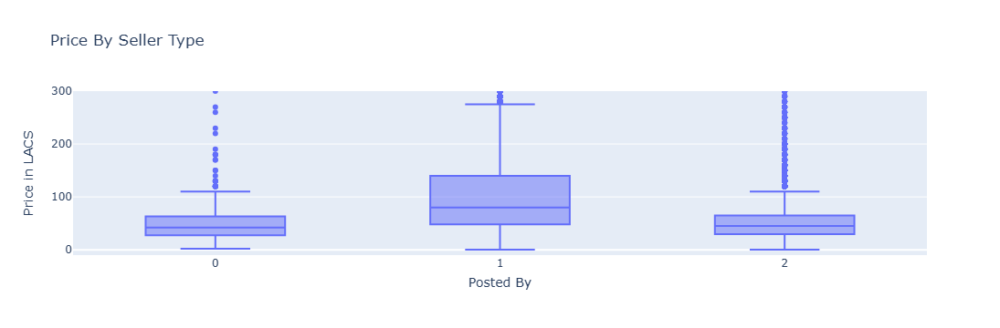

In [35]:
# posted by boxplot
 
fig=px.box(house_df_raw, x='POSTED_BY', y="TARGET(PRICE_IN_LACS)", title = 'Price By Seller Type')
fig.update_yaxes(
        range=[-10, 300], 
        title_text = "Price in LACS",
        title_standoff = 10)
fig.update_xaxes(
        title_text = "Posted By",
        title_standoff = 10)
fig

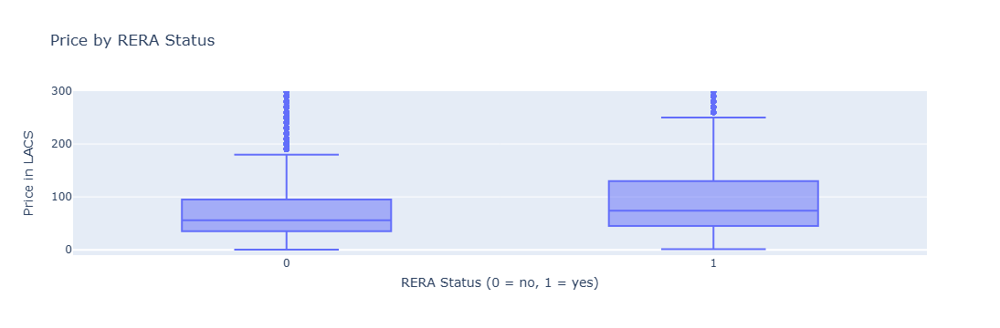

In [36]:
fig=px.box(house_df_raw, x='RERA', y="TARGET(PRICE_IN_LACS)", title= 'Price by RERA Status')
fig.update_yaxes(range=[-10, 300], title_text = "Price in LACS",
        title_standoff = 10)
fig.update_xaxes(
        title_text = "RERA Status (0 = no, 1 = yes)",
        title_standoff = 10)
fig

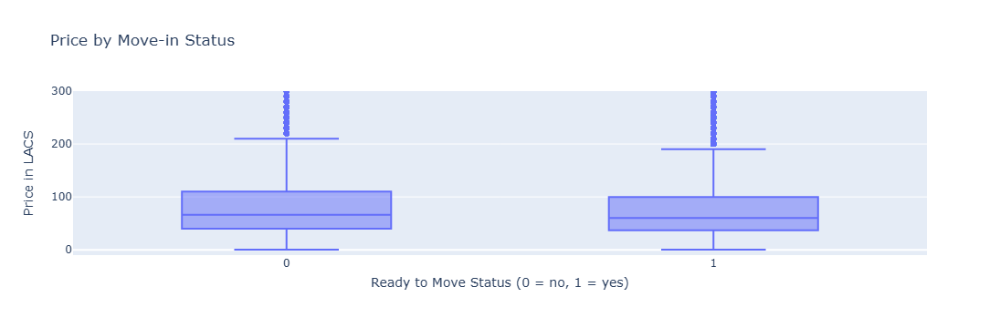

In [37]:
fig=px.box(house_df_raw, x='READY_TO_MOVE', y="TARGET(PRICE_IN_LACS)", title='Price by Move-in Status')
fig.update_yaxes(range=[-10, 300], title_text = "Price in LACS",
        title_standoff = 10)
fig.update_xaxes(
        title_text = "Ready to Move Status (0 = no, 1 = yes)",
        title_standoff = 10)
fig

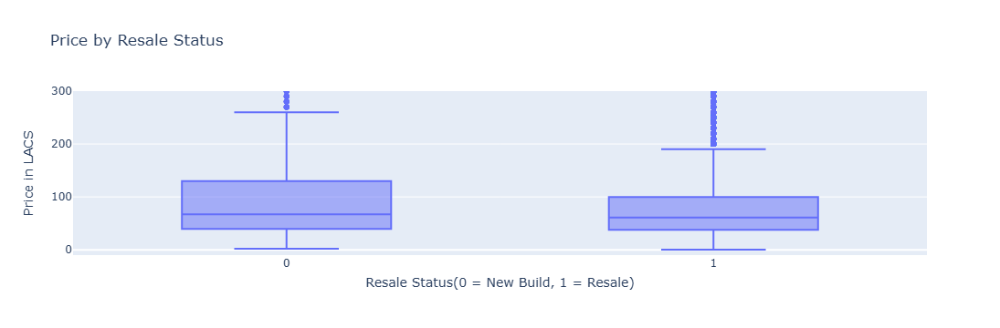

In [38]:
fig=px.box(house_df_raw, x='RESALE', y="TARGET(PRICE_IN_LACS)", title= 'Price by Resale Status')
fig.update_yaxes(range=[-10, 300], title_text = "Price in LACS",
        title_standoff = 10)
fig.update_xaxes(
        title_text = "Resale Status(0 = New Build, 1 = Resale)",
        title_standoff = 10)
fig

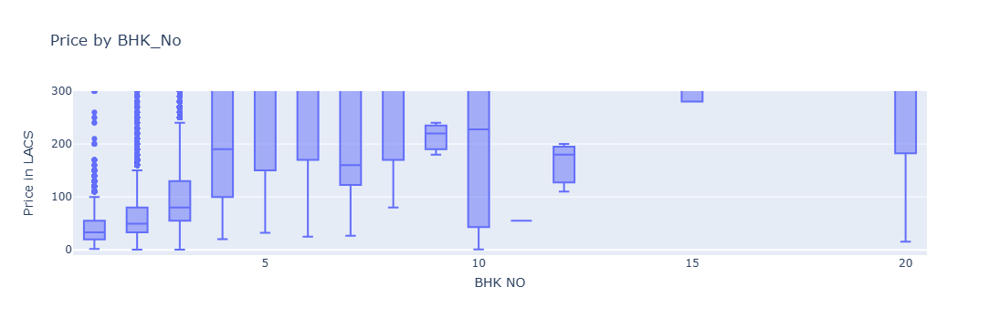

In [39]:
fig=px.box(house_df_raw, x='BHK_NO.', y="TARGET(PRICE_IN_LACS)", title= 'Price by BHK_No')
fig.update_yaxes(range=[-10, 300], title_text = "Price in LACS",
        title_standoff = 10)
fig.update_xaxes(
        title_text = "BHK NO",
        title_standoff = 10)
fig

In [40]:
house_df_raw.head()

,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,READY_TO_MOVE,RESALE,TARGET(PRICE_IN_LACS),PRICE_PER_SFT,POSTED_BY,BHK_OR_RK,ADDRESS
0,0,0,2,1300.236407,1,1,55.0,0.04,2,0,21
1,0,0,2,1275.000000,1,1,51.0,0.04,1,0,163
2,0,0,2,933.159722,1,1,43.0,0.05,2,0,21
3,0,1,2,929.921143,1,1,62.5,0.07,2,0,79
4,1,0,2,999.009247,0,1,60.5,0.06,1,0,136


In [41]:
house_df_raw_viz.head()

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,ADDRESS,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS),Price_per_sft,Address1,Address2
0,Owner,0,0,2,BHK,1300.236407,1,1,"Ksfc Layout,Bangalore",12.969910,77.597960,55.0,0.04,Ksfc Layout,Bangalore
1,Dealer,0,0,2,BHK,1275.000000,1,1,"Vishweshwara Nagar,Mysore",12.274538,76.644605,51.0,0.04,Vishweshwara Nagar,Mysore
2,Owner,0,0,2,BHK,933.159722,1,1,"Jigani,Bangalore",12.778033,77.632191,43.0,0.05,Jigani,Bangalore
3,Owner,0,1,2,BHK,929.921143,1,1,"Sector-1 Vaishali,Ghaziabad",28.642300,77.344500,62.5,0.07,Sector-1 Vaishali,Ghaziabad
4,Dealer,1,0,2,BHK,999.009247,0,1,"New Town,Kolkata",22.592200,88.484911,60.5,0.06,New Town,Kolkata


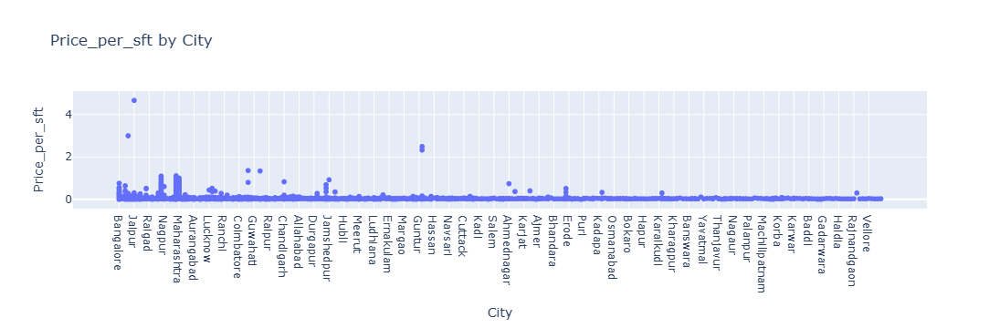

In [42]:
import plotly
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
 
#plotly.offline.init_notebook_mode(connected=True)
 
new_df1 = house_df_raw_viz[['Address2', 'Price_per_sft']]
 
fig = px.scatter(new_df1, x='Address2' , y='Price_per_sft', title='Price_per_sft by City')
fig.update_layout(
    xaxis_title='City'
)
fig.show()

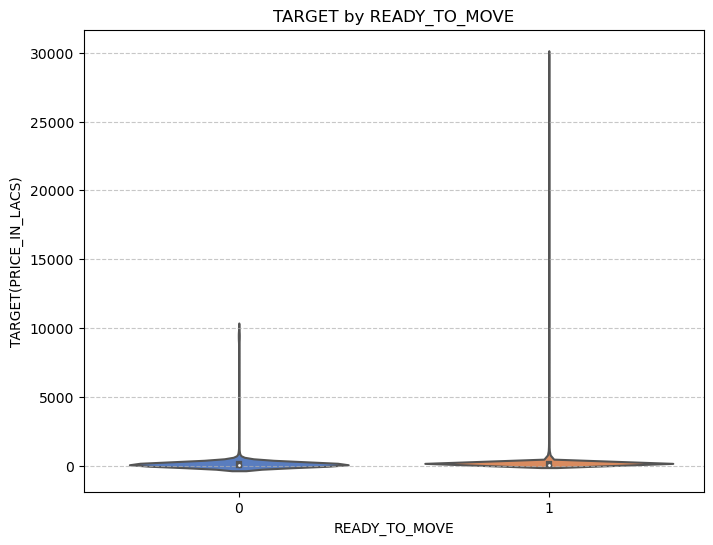

In [43]:
import seaborn as sns
 
#plotly.offline.init_notebook_mode(connected=True)
 
new_df2 = house_df_raw_viz[['READY_TO_MOVE', 'TARGET(PRICE_IN_LACS)']]
 
# Create a violin plot
plt.figure(figsize=(8, 6))
sns.violinplot(data=new_df2, x='READY_TO_MOVE', y='TARGET(PRICE_IN_LACS)', palette='muted')
plt.title('TARGET by READY_TO_MOVE')
plt.xlabel('READY_TO_MOVE')
plt.ylabel('TARGET(PRICE_IN_LACS)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

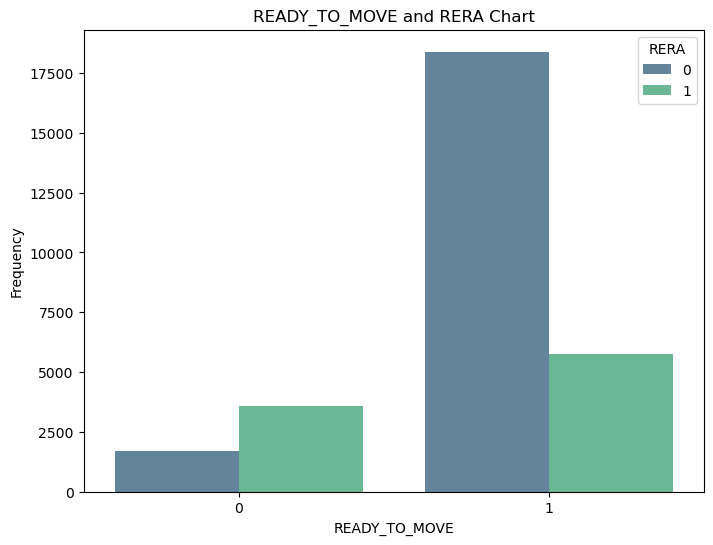

In [44]:
new_df3 = house_df_raw_viz[['READY_TO_MOVE', 'RERA']]
 
# Stacked bar plot
plt.figure(figsize=(8, 6))
sns.countplot(data=new_df3, x='READY_TO_MOVE', hue='RERA', palette='viridis', alpha=0.8)
plt.title('READY_TO_MOVE and RERA Chart')
plt.xlabel('READY_TO_MOVE')
plt.ylabel('Frequency')
plt.legend(title='RERA')
plt.show()

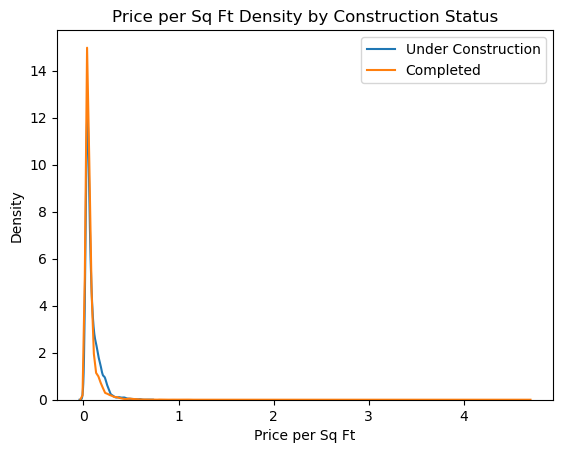

In [45]:
sns.kdeplot(data=house_df_raw_viz[house_df_raw_viz['UNDER_CONSTRUCTION'] == 1], x='Price_per_sft', label="Under Construction", palette='coolwarm')
sns.kdeplot(data=house_df_raw_viz[house_df_raw_viz['UNDER_CONSTRUCTION'] == 0], x='Price_per_sft', label="Completed", palette='coolwarm')
plt.xlabel("Price per Sq Ft")
plt.ylabel("Density")
plt.title("Price per Sq Ft Density by Construction Status")
plt.legend()
plt.show()

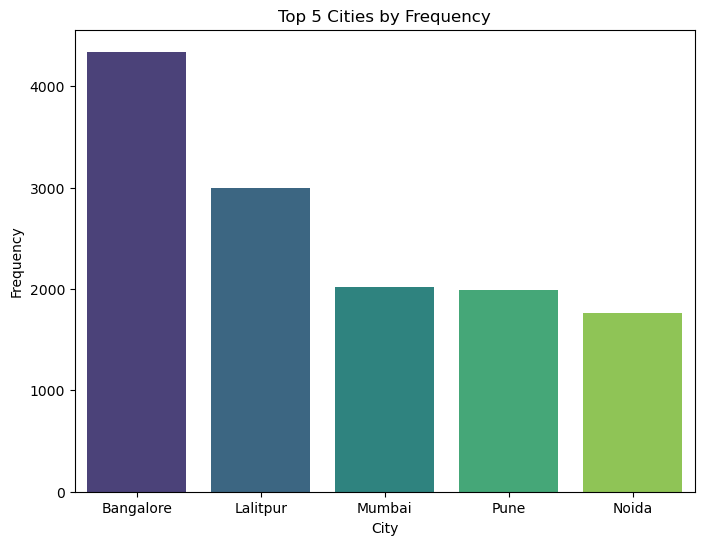

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns


top_cities = house_df_raw_viz['Address2'].value_counts().head(5)


plt.figure(figsize=(8, 6))
sns.barplot(x=top_cities.index, y=top_cities.values, palette='viridis')
plt.title('Top 5 Cities by Frequency')
plt.xlabel('City')
plt.ylabel('Frequency')
plt.show()


# LINEAR REGRESSION

In [48]:
house_df_lr=house_df_raw

In [49]:
house_df_lr = pd.get_dummies(house_df_lr, columns=['POSTED_BY'], drop_first=True)

In [50]:
house_df_lr.head()

,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,READY_TO_MOVE,RESALE,TARGET(PRICE_IN_LACS),PRICE_PER_SFT,BHK_OR_RK,ADDRESS,POSTED_BY_1,POSTED_BY_2
0,0,0,2,1300.236407,1,1,55.0,0.04,0,21,False,True
1,0,0,2,1275.000000,1,1,51.0,0.04,0,163,True,False
2,0,0,2,933.159722,1,1,43.0,0.05,0,21,False,True
3,0,1,2,929.921143,1,1,62.5,0.07,0,79,False,True
4,1,0,2,999.009247,0,1,60.5,0.06,0,136,True,False


In [51]:
house_df_lr['POSTED_BY_1'] = house_df_lr['POSTED_BY_1'].map({True: 1, False: 0})
house_df_lr['POSTED_BY_2'] = house_df_lr['POSTED_BY_2'].map({True: 1, False: 0})

In [52]:
house_df_lr = house_df_lr.rename(columns={
    'POSTED_BY_1': 'POSTED_BY_DEALER',
    'POSTED_BY_2': 'POSTED_BY_BUILDER'})

In [53]:
house_df_lr['SQUARE_FT_log'] = np.log1p(house_df_lr['SQUARE_FT']) 
house_df_lr['TARGET(PRICE_IN_LACS)_log'] = np.log1p(house_df_lr['TARGET(PRICE_IN_LACS)']) 

scaler = StandardScaler()
house_df_lr['SQUARE_FT_std'] = scaler.fit_transform(house_df_lr[['SQUARE_FT']])


In [54]:
house_df_lr.dtypes

UNDER_CONSTRUCTION             int64
RERA                           int64
BHK_NO.                        int64
SQUARE_FT                    float64
READY_TO_MOVE                  int64
RESALE                         int64
TARGET(PRICE_IN_LACS)        float64
PRICE_PER_SFT                float64
BHK_OR_RK                      int32
ADDRESS                        int32
POSTED_BY_DEALER               int64
POSTED_BY_BUILDER              int64
SQUARE_FT_log                float64
TARGET(PRICE_IN_LACS)_log    float64
SQUARE_FT_std                float64
dtype: object

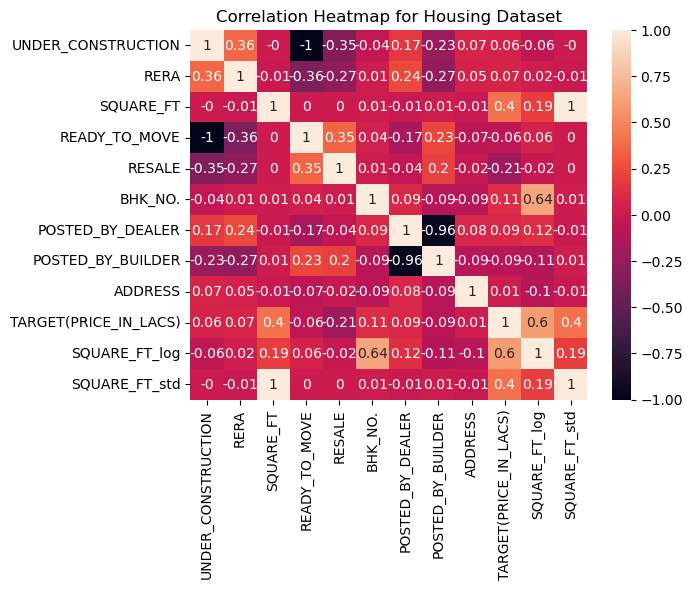

In [55]:

house_df_lr_matrix = house_df_lr[['UNDER_CONSTRUCTION','RERA','SQUARE_FT','READY_TO_MOVE','RESALE','BHK_NO.','POSTED_BY_DEALER','POSTED_BY_BUILDER','ADDRESS','TARGET(PRICE_IN_LACS)','SQUARE_FT_log','SQUARE_FT_std']].corr().round(2)
sns.heatmap(data= house_df_lr_matrix, annot=True)
plt.title('Correlation Heatmap for Housing Dataset')
plt.show()


In [56]:
house_df_lr=house_df_lr.drop(columns=['SQUARE_FT_std','SQUARE_FT','PRICE_PER_SFT'])

In [57]:
house_df_lr.head()

,UNDER_CONSTRUCTION,RERA,BHK_NO.,READY_TO_MOVE,RESALE,TARGET(PRICE_IN_LACS),BHK_OR_RK,ADDRESS,POSTED_BY_DEALER,POSTED_BY_BUILDER,SQUARE_FT_log,TARGET(PRICE_IN_LACS)_log
0,0,0,2,1,1,55.0,0,21,0,1,7.171070,4.025352
1,0,0,2,1,1,51.0,0,163,1,0,7.151485,3.951244
2,0,0,2,1,1,43.0,0,21,0,1,6.839647,3.784190
3,0,1,2,1,1,62.5,0,79,0,1,6.836175,4.151040
4,1,0,2,0,1,60.5,0,136,1,0,6.907765,4.119037


In [58]:
X_house_lr = house_df_lr.drop(columns =['TARGET(PRICE_IN_LACS)','TARGET(PRICE_IN_LACS)_log']) 
y_house_lr = house_df_lr['TARGET(PRICE_IN_LACS)_log']

In [59]:
X_house_lr.head()

,UNDER_CONSTRUCTION,RERA,BHK_NO.,READY_TO_MOVE,RESALE,BHK_OR_RK,ADDRESS,POSTED_BY_DEALER,POSTED_BY_BUILDER,SQUARE_FT_log
0,0,0,2,1,1,0,21,0,1,7.171070
1,0,0,2,1,1,0,163,1,0,7.151485
2,0,0,2,1,1,0,21,0,1,6.839647
3,0,1,2,1,1,0,79,0,1,6.836175
4,1,0,2,0,1,0,136,1,0,6.907765


In [60]:
y_house_lr.head()

0    4.025352
1    3.951244
2    3.784190
3    4.151040
4    4.119037
Name: TARGET(PRICE_IN_LACS)_log, dtype: float64

In [61]:
X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X_house_lr,y_house_lr, test_size=0.25, random_state=42)

In [62]:
from sklearn.linear_model import LinearRegression

def train_model(variables):
    if len(variables) == 0:
        return None
    model = LinearRegression()
    model.fit(X_train_lr[variables], y_train_lr)
    return model
 
def score_model(model, variables):
    if len(variables) == 0:
        return AIC_score(y_train_lr, [y_train_lr.mean()] * len(y_train_lr), model, df=1)
    return AIC_score(y_train_lr, model.predict(X_train_lr[variables]), model)
 
best_model, best_variables = forward_selection(X_train_lr.columns, train_model, score_model, verbose=True)


Variables: UNDER_CONSTRUCTION, RERA, BHK_NO., READY_TO_MOVE, RESALE, BHK_OR_RK, ADDRESS, POSTED_BY_DEALER, POSTED_BY_BUILDER, SQUARE_FT_log
Start: score=57716.95, constant
Step: score=45850.87, add SQUARE_FT_log
Step: score=42364.49, add POSTED_BY_DEALER
Step: score=42034.84, add BHK_NO.
Step: score=41778.43, add RESALE
Step: score=41689.53, add ADDRESS
Step: score=41621.95, add RERA
Step: score=41575.94, add POSTED_BY_BUILDER
Step: score=41573.13, add BHK_OR_RK
Step: score=41573.13, add None


In [63]:
X_train_lr_model = pd.DataFrame(X_train_lr[['SQUARE_FT_log','BHK_NO.','RESALE','POSTED_BY_DEALER']])
X_test_lr_model = pd.DataFrame(X_test_lr[['SQUARE_FT_log','BHK_NO.','RESALE','POSTED_BY_DEALER']])

In [64]:
X_test_lr_model.head()

,SQUARE_FT_log,BHK_NO.,RESALE,POSTED_BY_DEALER
10932,6.770145,2,1,1
18959,7.126094,2,1,1
29389,6.887849,3,0,0
24851,7.439110,3,1,0
13601,7.451054,3,1,1


In [65]:
linear_regression_model = LinearRegression()
linear_regression_model.fit(X_train_lr_model, y_train_lr)

print("Below is the model summary for Model: ")
print("Intercept is: " + str(linear_regression_model.intercept_))
print("The coeffcients are as follows: " + str(linear_regression_model.coef_))
print("The score for model: ", linear_regression_model.score(X_train_lr_model, y_train_lr))


Below is the model summary for Model: 
Intercept is: -1.7693628126684882
The coeffcients are as follows: [ 0.7951788   0.11672913 -0.26277007  0.53362875]
The score for model:  0.5142455971812676


In [66]:
y_pred_train=linear_regression_model.predict(X_train_lr_model) 

In [67]:
r2 = r2_score(y_train_lr, y_pred_train)
print(f"R square value of the model: {r2}")

R square value of the model: 0.5142455971812676


In [68]:
y_test_lr=np.exp(y_test_lr)

In [69]:
y_pred_new = linear_regression_model.predict(X_test_lr_model) 

In [70]:
y_pred_new=np.exp(y_pred_new)

In [71]:
min_y = y_test_lr.min()
max_y = y_test_lr.max()
range_y = max_y - min_y
print(f"Min: {min_y}")
print(f"max: {max_y}")
print(f"Range of target: {range_y}")
 

mse_model1 = mean_squared_error(y_test_lr, y_pred_new)
rmse_model1 = np.sqrt(mse_model1)
print(f"Root Mean Square Error (RMSE): {rmse_model1}")
r2 = r2_score(y_test_lr, y_pred_new)
print(f"R square value of the model: {r2}")

Min: 2.0
max: 9901.000000000004
Range of target: 9899.000000000004
Root Mean Square Error (RMSE): 327.77464810016465
R square value of the model: 0.5535524585714913


In [72]:
y_pred_new_df=pd.DataFrame(y_pred_new,columns=['y_pred_new'])
y_pred_new_df = y_pred_new_df.reset_index(drop=True)

In [73]:
y_test_lr_df=pd.DataFrame(y_test_lr)
y_test_lr_df = y_test_lr_df.reset_index(drop=True)

In [74]:
Predictions_linear_regression = pd.concat([y_test_lr_df, y_pred_new_df], axis=1)
Predictions_linear_regression = Predictions_linear_regression.reset_index(drop=True)
Predictions_linear_regression.columns = ['Actual_Price', 'Predicted_Price']

In [75]:
Predictions_linear_regression.head(10)

,Actual_Price,Predicted_Price
0,27.0,61.462682
1,101.0,81.570919
2,28.9,57.852486
3,66.0,68.956582
4,361.0,118.700489
5,111.0,139.774822
6,111.0,118.403747
7,11.7,40.707015
8,58.4,70.859832
9,86.0,79.323361


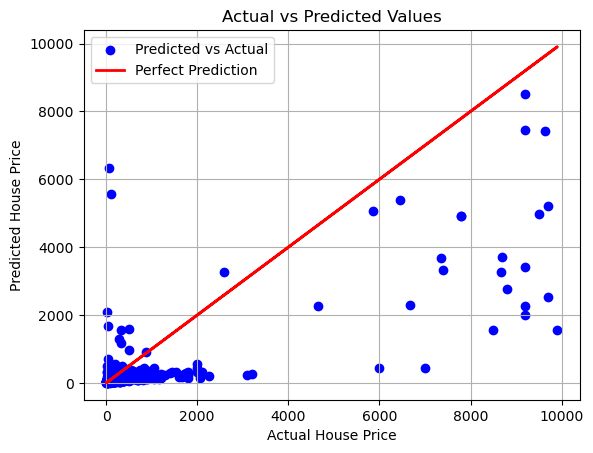

In [76]:
import matplotlib.pyplot as plt
import numpy as np


plt.scatter(y_test_lr, y_pred_new, color='blue', label='Predicted vs Actual')
plt.plot(y_test_lr, y_test_lr, color='red', linewidth=2, label='Perfect Prediction')


plt.xlabel('Actual House Price')
plt.ylabel('Predicted House Price')
plt.title('Actual vs Predicted Values')
plt.legend()


plt.grid(True)



# POLYNOMIAL REGRESSION

In [78]:
house_df_pr=house_df_raw

In [79]:
house_df_pr.head()

,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,READY_TO_MOVE,RESALE,TARGET(PRICE_IN_LACS),PRICE_PER_SFT,POSTED_BY,BHK_OR_RK,ADDRESS
0,0,0,2,1300.236407,1,1,55.0,0.04,2,0,21
1,0,0,2,1275.000000,1,1,51.0,0.04,1,0,163
2,0,0,2,933.159722,1,1,43.0,0.05,2,0,21
3,0,1,2,929.921143,1,1,62.5,0.07,2,0,79
4,1,0,2,999.009247,0,1,60.5,0.06,1,0,136


In [80]:
house_df_pr['SQUARE_FT_log'] = np.log1p(house_df_pr['SQUARE_FT']) 
house_df_pr['TARGET(PRICE_IN_LACS)_log'] = np.log1p(house_df_pr['TARGET(PRICE_IN_LACS)']) 
X_house_pr = house_df_pr[['RERA', 'BHK_NO.', 'SQUARE_FT_log', 'READY_TO_MOVE', 'RESALE']]
y_house_pr = house_df_pr[['TARGET(PRICE_IN_LACS)_log']]

In [81]:
polynomial_converter = PolynomialFeatures(degree=3,include_bias=False)

In [82]:
poly_features = polynomial_converter.fit_transform(X_house_pr)

In [83]:
poly_features = sm.add_constant(poly_features)

In [84]:
poly_features[0]

array([  1.        ,   0.        ,   2.        ,   7.17107017,
         1.        ,   1.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   4.        ,
        14.34214035,   2.        ,   2.        ,  51.42424744,
         7.17107017,   7.17107017,   1.        ,   1.        ,
         1.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         8.        ,  28.6842807 ,   4.        ,   4.        ,
       102.84849487,  14.34214035,  14.34214035,   2.        ,
         2.        ,   2.        , 368.766887  ,  51.42424744,
        51.42424744,   7.17107017,   7.17107017,   7.17107017,
         1.        ,   1.        ,   1.        ,   1.        ])

In [85]:
X_train_pr, X_test_pr, y_train_pr, y_test_pr = train_test_split(poly_features, y_house_pr, test_size=0.3, random_state=0)

In [86]:
model = sm.OLS(y_train_pr, X_train_pr).fit()

In [87]:
train_predictions=model.predict(X_train_pr) 

In [88]:
y_train_pr=np.exp(y_train_pr)
train_predictions=np.exp(train_predictions)

In [89]:
import numpy as np
MAE = mean_absolute_error(y_train_pr,train_predictions)
MSE = mean_squared_error(y_train_pr,train_predictions)
RMSE = np.sqrt(MSE)
r2 = r2_score(y_train_pr, train_predictions)

In [90]:
print('MAE:',MAE)
print('MSE:',MSE)
print('RMSE:',RMSE)
print('r2:',r2)

MAE: 66.0590406149331
MSE: 95193.28437951837
RMSE: 308.5340894933952
r2: 0.7311535102673885


In [91]:
test_predictions = model.predict(X_test_pr)

In [92]:
y_test_pr=np.exp(y_test_pr)
test_predictions=np.exp(test_predictions)

In [93]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

MAE = mean_absolute_error(y_test_pr,test_predictions)
MSE = mean_squared_error(y_test_pr,test_predictions)
RMSE = np.sqrt(MSE)
r2 = r2_score(y_test_pr, test_predictions)

In [94]:
print('MAE:',MAE)
print('MSE:',MSE)
print('RMSE:',RMSE)
print('r2:',r2)

MAE: 75.38068355073554
MSE: 344074.0589242482
RMSE: 586.5782632558492
r2: 0.4379709383143531


In [95]:
y_test_pr_df=pd.DataFrame(y_test_pr)
y_test_pr_df = y_test_pr_df.reset_index(drop=True)


In [96]:

test_predictions_df=pd.DataFrame(test_predictions)
test_predictions_df = test_predictions_df.reset_index(drop=True)


In [97]:

Predictions_polynomial_regression = pd.concat([y_test_pr_df, test_predictions_df], axis=1)
Predictions_polynomial_regression = Predictions_polynomial_regression.reset_index(drop=True)
Predictions_polynomial_regression.columns = ['Actual_Price', 'Predicted_Price']
Predictions_polynomial_regression


,Actual_Price,Predicted_Price
0,101.0,120.135967
1,42.0,261.412614
2,121.0,97.840457
3,61.0,60.864436
4,93.0,64.627862
...,...,...
8830,41.0,60.520078
8831,53.1,139.407509
8832,61.0,65.088868
8833,17.5,30.301986


In [98]:
Predictions_polynomial_regression[Predictions_polynomial_regression['Actual_Price']>10000]

,Actual_Price,Predicted_Price
1378,28001.0,9.533214e-18
4564,25001.0,4.515875e-12
5185,30001.0,3.648886e-16


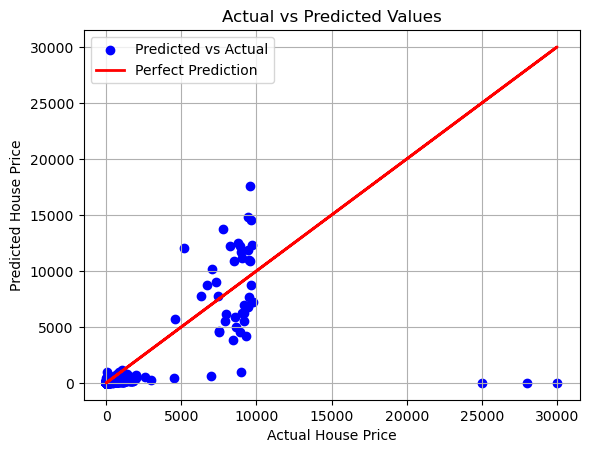

In [99]:
import matplotlib.pyplot as plt
import numpy as np


plt.scatter(y_test_pr, test_predictions, color='blue', label='Predicted vs Actual')
plt.plot(y_test_pr, y_test_pr, color='red', linewidth=2, label='Perfect Prediction')


plt.xlabel('Actual House Price')
plt.ylabel('Predicted House Price')
plt.title('Actual vs Predicted Values')
plt.legend()


plt.grid(True)



# DECISION TREE

In [101]:
house_df_dt=house_df_raw

In [102]:
house_df_dt.head()

,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,READY_TO_MOVE,RESALE,TARGET(PRICE_IN_LACS),PRICE_PER_SFT,POSTED_BY,BHK_OR_RK,ADDRESS,SQUARE_FT_log,TARGET(PRICE_IN_LACS)_log
0,0,0,2,1300.236407,1,1,55.0,0.04,2,0,21,7.171070,4.025352
1,0,0,2,1275.000000,1,1,51.0,0.04,1,0,163,7.151485,3.951244
2,0,0,2,933.159722,1,1,43.0,0.05,2,0,21,6.839647,3.784190
3,0,1,2,929.921143,1,1,62.5,0.07,2,0,79,6.836175,4.151040
4,1,0,2,999.009247,0,1,60.5,0.06,1,0,136,6.907765,4.119037


In [103]:
house_df_dt.drop(columns=['PRICE_PER_SFT','SQUARE_FT_log','TARGET(PRICE_IN_LACS)_log'], inplace=True)

In [104]:
X_house_dt = house_df_dt.drop(columns =['TARGET(PRICE_IN_LACS)'])
y_house_dt = house_df_dt['TARGET(PRICE_IN_LACS)'] 

In [105]:
from sklearn.model_selection import train_test_split
 
X_train_dt, X_test_dt, y_train_dt, y_test_dt = train_test_split(X_house_dt, y_house_dt, test_size=0.30, random_state = 45)

In [106]:
from sklearn.tree import DecisionTreeRegressor, plot_tree

#DEPTH - 4

In [108]:
regressor4 = DecisionTreeRegressor(max_depth = 4, random_state = 0)
regressor4.fit(X_train_dt, y_train_dt)

DecisionTreeRegressor(max_depth=4, random_state=0)

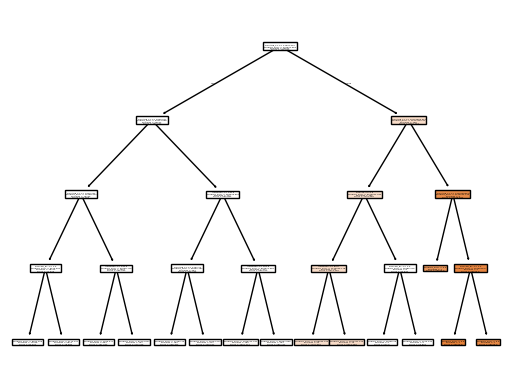

In [109]:
plt.figure()
plot_tree(regressor4, feature_names=X_train_dt.columns.tolist(), filled=True)
plt.show()

In [110]:
train_data_pred = regressor4.predict(X_train_dt) 
test_data_pred = regressor4.predict(X_test_dt)

In [111]:
from sklearn.metrics import r2_score

r2 = r2_score(y_train_dt, train_data_pred)
print(f"R2: {r2}")
rmse = np.sqrt(mean_squared_error(y_train_dt, train_data_pred))
print(f"RMSE: {rmse}")

R2: 0.9388725124421861
RMSE: 169.98075677010874


In [112]:
r2 = r2_score(y_test_dt, test_data_pred)
#r2
print(f"R2: {r2}")
 
# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test_dt, test_data_pred))
print(f"RMSE: {rmse}")

R2: 0.8906446181527108
RMSE: 191.53639014629977


In [113]:
pd.set_option('display.max_rows', 1500)

df = pd.DataFrame(y_test_dt)
df_new = pd.DataFrame(test_data_pred)

df = df.reset_index(drop=True)
df_new = df_new.reset_index(drop=True)

Predictions_decision_tree = pd.concat([df, df_new], axis=1)
Predictions_decision_tree = Predictions_decision_tree.reset_index(drop=True)

Predictions_decision_tree.columns = ['Actual_Price', 'Predicted_Price']



In [114]:
Predictions_decision_tree.head(10)

,Actual_Price,Predicted_Price
0,25.8,94.431518
1,72.0,48.685867
2,29.5,48.685867
3,120.0,151.023770
4,300.0,272.325884
5,160.0,94.431518
6,43.4,94.431518
7,35.3,48.685867
8,85.0,48.685867
9,220.0,420.601422


In [115]:
# Assuming feature_names is the list of all feature names
importance_scores = regressor4.feature_importances_
used_features_importance = pd.DataFrame({
    "Feature": X_train_dt.columns.tolist(),
    "Importance": importance_scores
})
 
# Filter features with non-zero importance
used_features_importance = used_features_importance[used_features_importance["Importance"] > 0]
 
print("Selected Features and Importances:")
print(used_features_importance)

Selected Features and Importances:
     Feature  Importance
3  SQUARE_FT    0.933012
5     RESALE    0.055400
6  POSTED_BY    0.001198
8    ADDRESS    0.010391


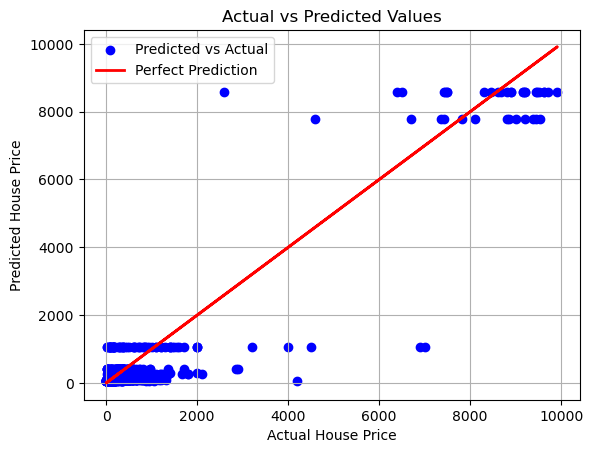

In [116]:
import matplotlib.pyplot as plt
import numpy as np

plt.scatter(y_test_dt, test_data_pred, color='blue', label='Predicted vs Actual')
plt.plot(y_test_dt, y_test_dt, color='red', linewidth=2, label='Perfect Prediction')

plt.xlabel('Actual House Price')
plt.ylabel('Predicted House Price')
plt.title('Actual vs Predicted Values')
plt.legend()

plt.grid(True)

# RANDOM FOREST - FINAL MODEL

In [118]:
house_df_rf=house_df_raw

In [119]:
house_df_rf.head()

,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,READY_TO_MOVE,RESALE,TARGET(PRICE_IN_LACS),POSTED_BY,BHK_OR_RK,ADDRESS
0,0,0,2,1300.236407,1,1,55.0,2,0,21
1,0,0,2,1275.000000,1,1,51.0,1,0,163
2,0,0,2,933.159722,1,1,43.0,2,0,21
3,0,1,2,929.921143,1,1,62.5,2,0,79
4,1,0,2,999.009247,0,1,60.5,1,0,136


In [120]:
X_house_rf = house_df_rf.drop(columns =['TARGET(PRICE_IN_LACS)','BHK_OR_RK']) 
y_house_rf = house_df_rf['TARGET(PRICE_IN_LACS)']

In [121]:
X_train, X_test, y_train, y_test = train_test_split(X_house_rf, y_house_rf, test_size=0.3, random_state=42)

In [122]:
X_train.columns = X_train.columns.astype(str)

regressor = RandomForestRegressor(n_estimators=10, random_state=0, oob_score=True, max_depth=6)
regressor.fit(X_train, y_train)
y_train_pred = regressor.predict(X_train)

mse = mean_squared_error(y_train, y_train_pred)
print(f'Mean Squared Error: {mse}')

rmse = np.sqrt(mse)
print(f'Root Mean Squared Error: {rmse}')

r2 = r2_score(y_train, y_train_pred)
print(f'R-squared: {r2}')

Mean Squared Error: 21556.52291242479
Root Mean Squared Error: 146.82139800596093
R-squared: 0.9574113781724128


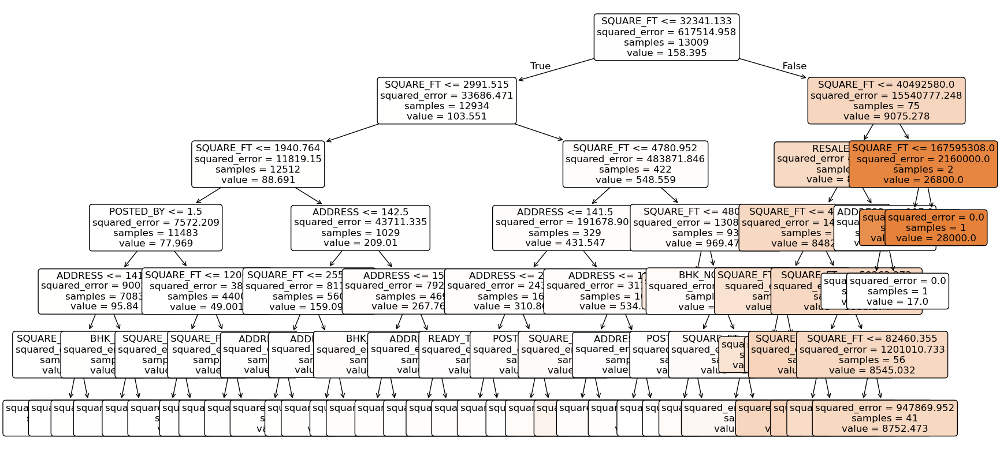

In [123]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
from sklearn.ensemble import RandomForestRegressor


regressor = RandomForestRegressor(n_estimators=10, random_state=0, oob_score=True, max_depth=6)
regressor.fit(X_train, y_train)


plt.figure(figsize=(20,10))  
plot_tree(regressor.estimators_[0], 
          feature_names=X_train.columns, 
          filled=True, 
          rounded=True, 
          fontsize=12)
plt.show()


In [124]:

importances = regressor.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': importances
})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print(feature_importance_df)


              Feature  Importance
3           SQUARE_FT    0.937559
5              RESALE    0.044834
7             ADDRESS    0.011058
2             BHK_NO.    0.003234
6           POSTED_BY    0.002284
1                RERA    0.000588
4       READY_TO_MOVE    0.000280
0  UNDER_CONSTRUCTION    0.000162


In [125]:
oob_score = regressor.oob_score_
print(f'Out-of-Bag Score: {oob_score}')

predictions = regressor.predict(X_test)

mse = mean_squared_error(y_test, predictions)
print(f'Mean Squared Error: {mse}')

rmse=np.sqrt(mse)
print(f'rmse: {rmse}')

r2 = r2_score(y_test, predictions)
print(f'R-squared: {r2}')

Out-of-Bag Score: 0.8821608202612268
Mean Squared Error: 25091.55418920722
rmse: 158.40313819242098
R-squared: 0.9024034010233071


In [126]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor


grid = { 
    'max_depth': [4, 5, 6, 7, 8],
    'criterion': ['squared_error'],
    'n_estimators': [10,20,50,100],
    'random_state': [0]
}


rf_cv = GridSearchCV(estimator=RandomForestRegressor(), param_grid=grid, cv=5, n_jobs=-1)  # Set n_jobs=-1 to use all CPU cores


rf_cv.fit(X_train, y_train)


print("Best Parameters: ", rf_cv.best_params_)


Best Parameters:  {'criterion': 'squared_error', 'max_depth': 6, 'n_estimators': 10, 'random_state': 0}


In [127]:
y_test

10932     26.00
18959    100.00
29389     27.90
24851     65.00
13601    360.00
          ...  
19205     41.80
5219      14.00
27192      0.29
11830     79.00
21368    380.00
Name: TARGET(PRICE_IN_LACS), Length: 8835, dtype: float64

In [128]:
predictions

array([ 41.23857778,  72.41591378,  41.23857778, ...,  63.45796465,
        83.98563058, 202.58035942])

In [129]:
predictions_df = pd.DataFrame(predictions,columns=['predictions'])
predictions_df = predictions_df.reset_index(drop=True)
predictions_df

,predictions
0,41.238578
1,72.415914
2,41.238578
3,83.659149
4,241.774481
...,...
8830,43.717082
8831,26.252360
8832,63.457965
8833,83.985631


In [130]:
y_test_df = pd.DataFrame(y_test)
y_test_df = y_test_df.reset_index(drop=True)
y_test_df

,TARGET(PRICE_IN_LACS)
0,26.00
1,100.00
2,27.90
3,65.00
4,360.00
...,...
8830,41.80
8831,14.00
8832,0.29
8833,79.00


In [131]:
Predictions_random_forest = pd.concat([y_test_df, predictions_df], axis=1)
Predictions_random_forest = Predictions_random_forest.reset_index(drop=True)
Predictions_random_forest.columns = ['Actual_Price', 'Predicted_Price']

In [132]:
Predictions_random_forest.head(10)

,Actual_Price,Predicted_Price
0,26.0,41.238578
1,100.0,72.415914
2,27.9,41.238578
3,65.0,83.659149
4,360.0,241.774481
5,110.0,84.521952
6,110.0,131.647947
7,10.7,41.238578
8,57.4,72.415914
9,85.0,115.073586


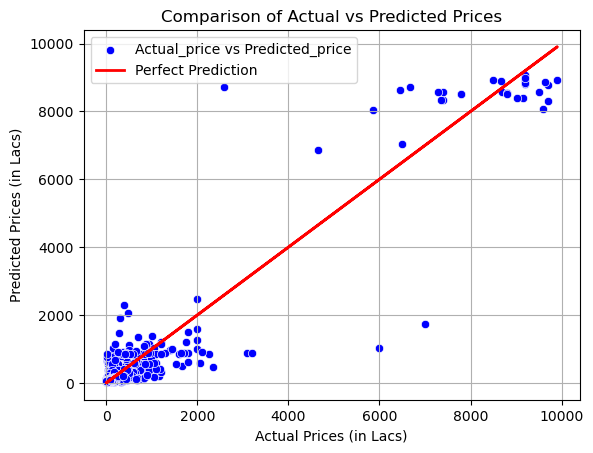

In [133]:
import matplotlib.pyplot as plt
import seaborn as sns


sns.scatterplot(x=Predictions_random_forest['Actual_Price'], y=Predictions_random_forest['Predicted_Price'], color='blue', label='Actual_price vs Predicted_price')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect Prediction')
plt.title('Comparison of Actual vs Predicted Prices')
plt.xlabel('Actual Prices (in Lacs)')
plt.ylabel('Predicted Prices (in Lacs)')
plt.legend()
plt.grid()
